In [1]:
import sys
import pathlib
pth=str(pathlib.Path().absolute())
sys.path.append(('\\').join(pth.split('\\')[:-1])+"\\Utils")
from Utilities import *

In [2]:
name='c1anemia-300'
di=('\\').join(pth.split('\\')[:-2])+'\\Data_base\\Imagenes_originales\\'+name+'.jpg'
ROI=('\\').join(pth.split('\\')[:-2])+'\\Data_base\\Sem_Auto\\eye_'+name+'.jpg'
img = io.imread(di)
ROI = io.imread(ROI)

In [14]:
f1=open(('\\').join(pth.split('\\')[:-2])+"\\Data_base\\validcrop.txt","r")
lines=f1.readlines()
linesn=np.array(lines)
linesn=np.delete(lines,np.where(linesn=="\n"))
linesn=linesn.reshape(-1,3)
linesnc=v_replace_err(linesn)
linesnc=np.vectorize(pyfunc=lambda x:np.array([x[0].split('\n')[0]]),signature="(n)->(m)")(linesnc.reshape(-1,1)).reshape(-1,3)
xywh=linesnc[:,:2]
imgnames=linesnc[:,2]
xywh=v_no_spaces(xywh)
xywh=np.vectorize(pyfunc=(lambda x:float(x)))(xywh.reshape(1,-1)[0])
xywh=xywh.reshape(-1,4).astype(int)+1

mr=xywh[np.where(imgnames==(name+".jpg"))][0]
mask=assemble_mask(mr,img,ROI)

format_key={"R":0,"G":1,"B":2,"H":3,"S":4,"V":5,"L":6,"a":7,"b":8}

In [4]:
lum = np.mean(mask,axis=2).astype(int)
mask1=lum>0
m_slic = slic(img, n_segments=20,sigma=5,mask=mask1)

In [5]:
RID=np.unique(m_slic.flatten())
f=np.zeros((img.shape[0],img.shape[1],3+3+3+1))
f[:,:,0:3]=img[:,:,0:3]
f[:,:,3:6]=color.rgb2hsv(img)[:,:,0:3]
f[:,:,6:9]=color.rgb2lab(img)[:,:,0:3]
f[:,:,9]=m_slic

In [143]:
def get_Hist_by_format(f,ind1,ind2,j):
    hist=np.vectorize(pyfunc=(lambda t:np.histogram(f[ind1,ind2,t],bins=1000,range=(0,255))),
                  signature='()->(j),(k)')(j)
    return hist[0],hist[1]
v_get_Hist_by_format=np.vectorize(pyfunc=get_Hist_by_format,signature='(x,y,z),(a),(b),(j)->(j,q),(j,w)')

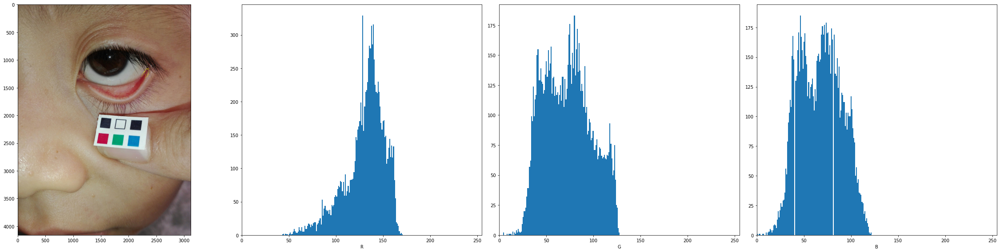

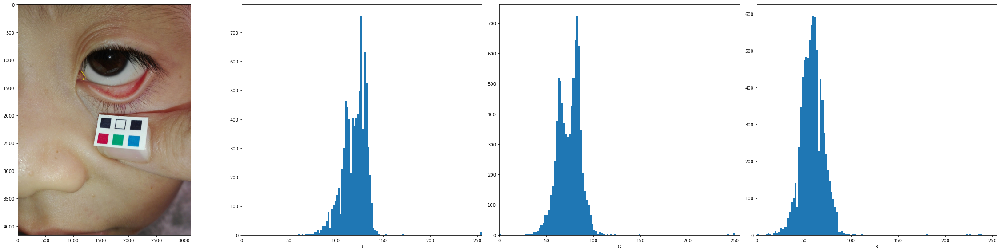

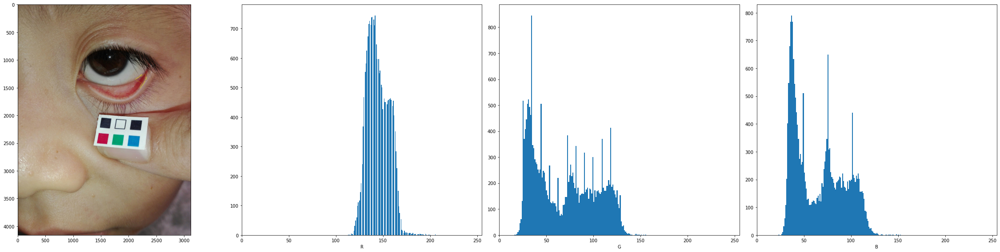

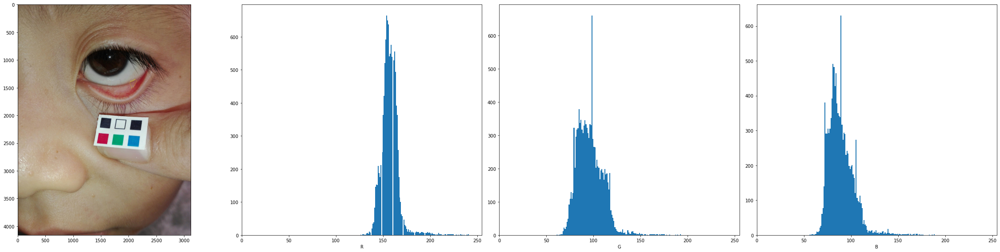

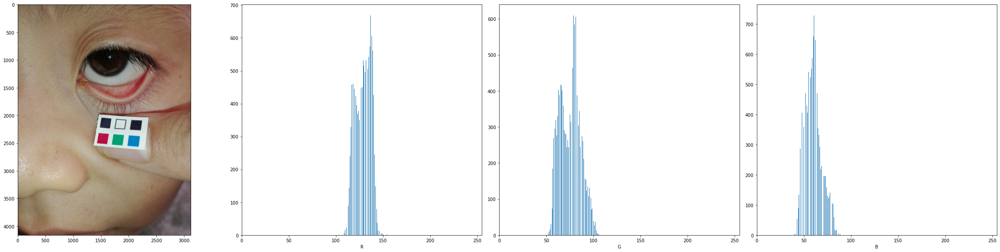

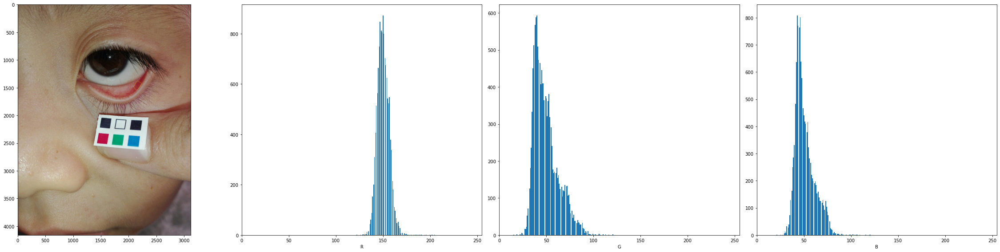

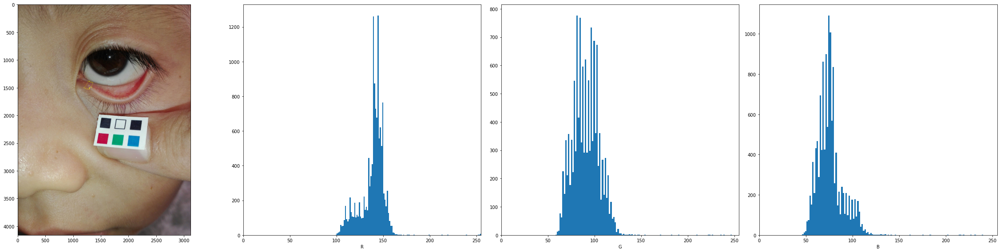

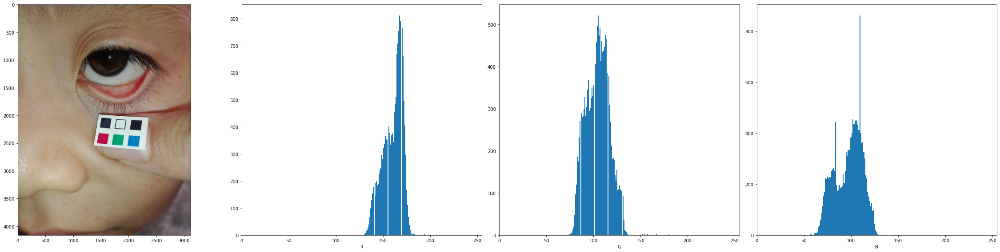

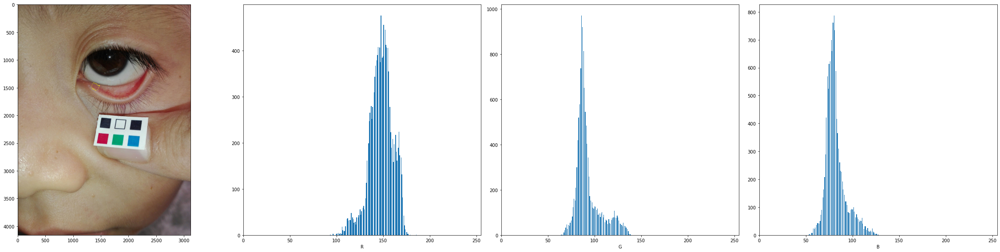

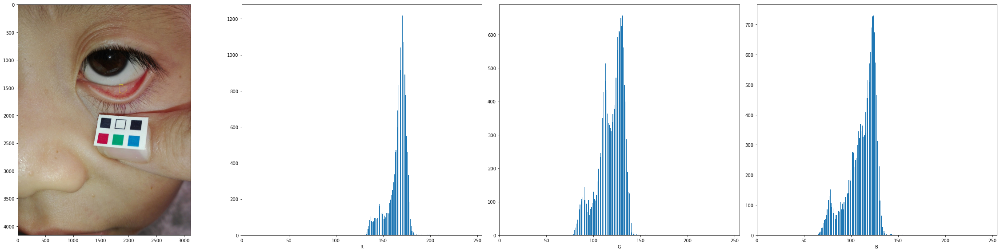

In [159]:
for i in range(1,11):
    indx=np.where(f[:,:,9]==i)
    hists=v_get_Hist_by_format(f,indx[0],indx[1],np.arange(0,9))
    fig, (axi,ax0,ax1,ax2) = plt.subplots(ncols=4, figsize=(32, 8))
    axi.imshow(mark_boundaries(img, m_slic==i, mode='inner',background_label=10))

    ax0.hist(f[indx[0],indx[1],0],125)
    ax0.set_xlabel("R")
    ax0.set_xlim([0,255])
    ax1.hist(f[indx[0],indx[1],1],125)
    ax1.set_xlabel("G")
    ax1.set_xlim([0,255])
    ax2.hist(f[indx[0],indx[1],2],125)
    ax2.set_xlim([0,255])
    ax2.set_xlabel("B")

    plt.tight_layout()
    plt.show()

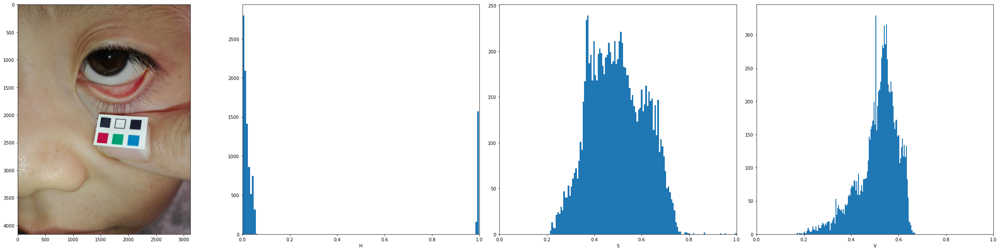

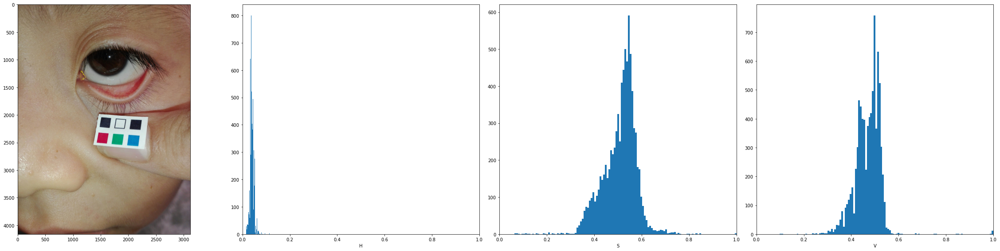

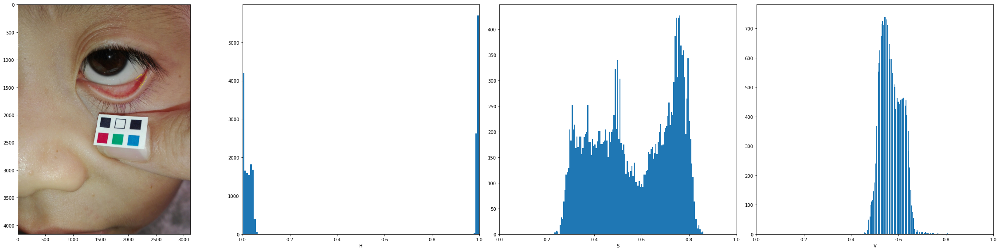

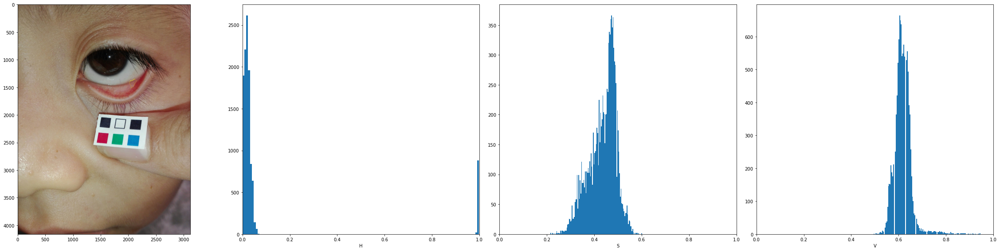

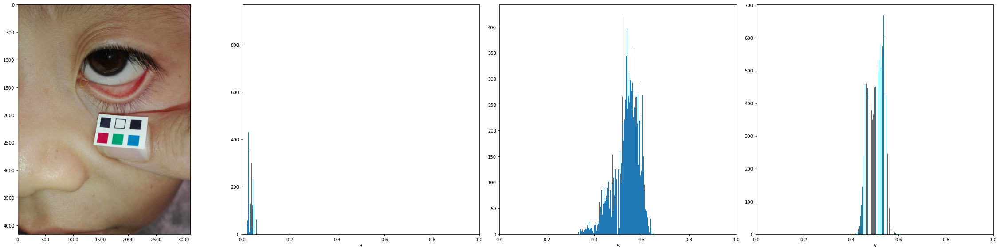

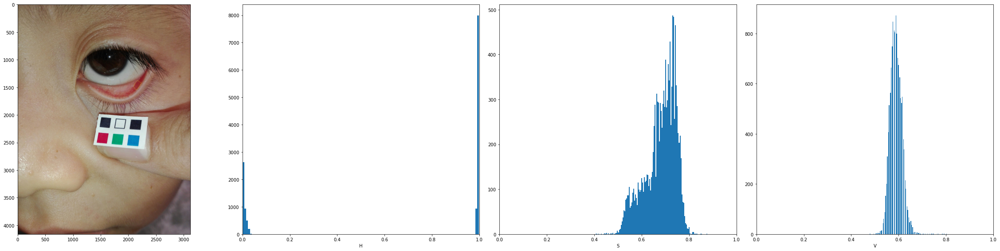

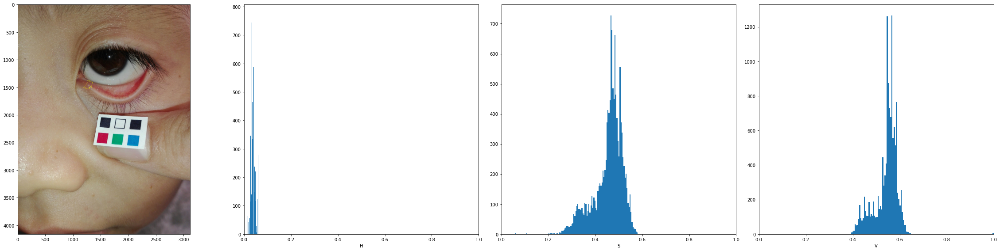

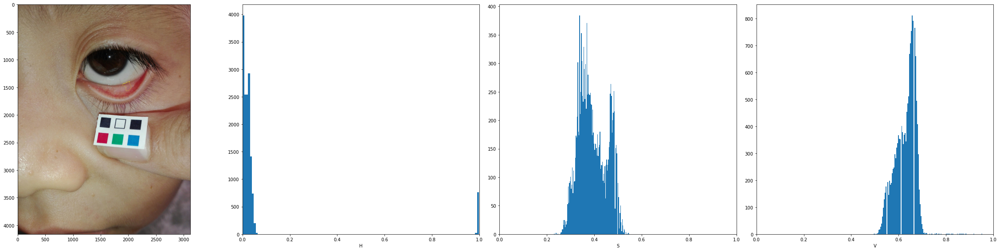

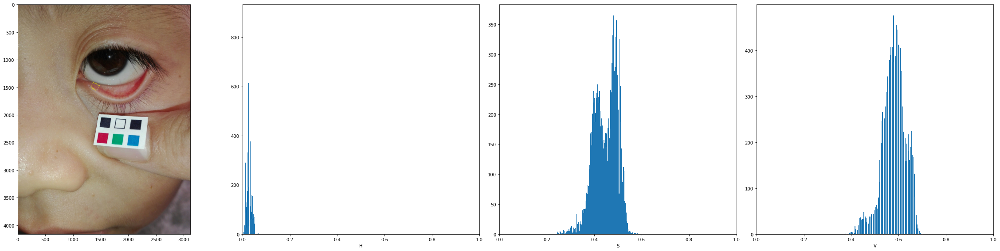

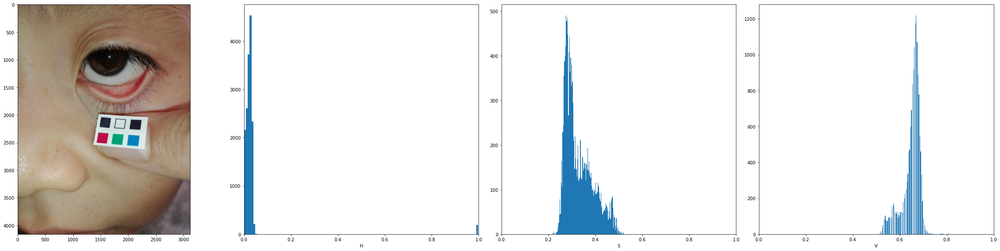

In [160]:
for i in range(1,11):
    indx=np.where(f[:,:,9]==i)
    hists=v_get_Hist_by_format(f,indx[0],indx[1],np.arange(0,9))
    fig, (axi,ax0,ax1,ax2) = plt.subplots(ncols=4, figsize=(32, 8))
    #fig, (axi,ax2) = plt.subplots(ncols=2, figsize=(32, 8))
    axi.imshow(mark_boundaries(img, m_slic==i, mode='inner',background_label=50))

    ax0.hist(f[indx[0],indx[1],3],125)
    ax0.set_xlabel("H")
    ax0.set_xlim([0,1])
    ax1.hist(f[indx[0],indx[1],4],125)
    ax1.set_xlabel("S")
    ax1.set_xlim([0,1])
    ax2.hist(f[indx[0],indx[1],5],125)
    ax2.set_xlim([0,1])
    ax2.set_xlabel("V")
    
    plt.tight_layout()
    plt.show()

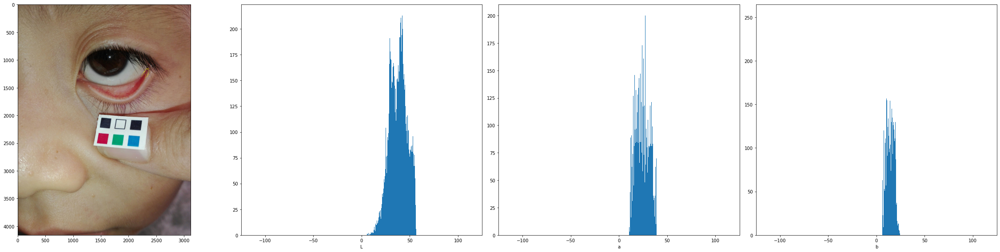

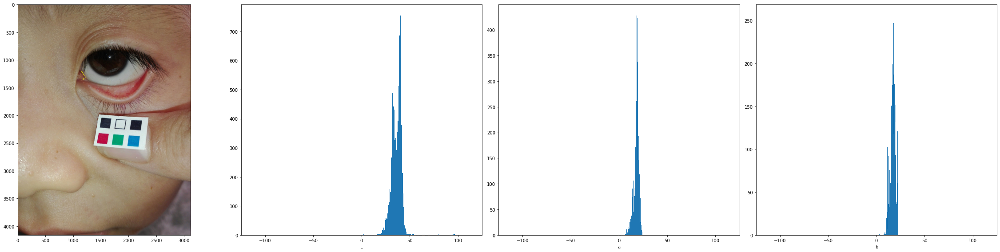

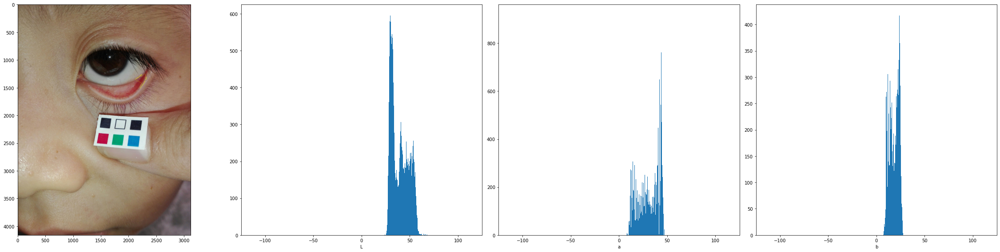

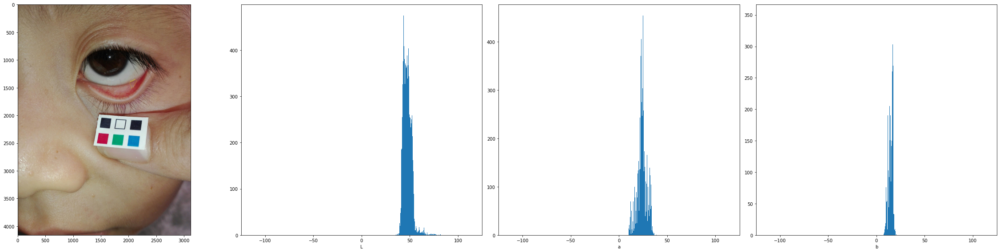

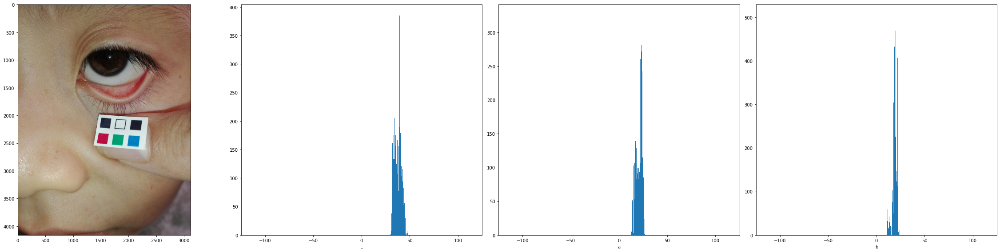

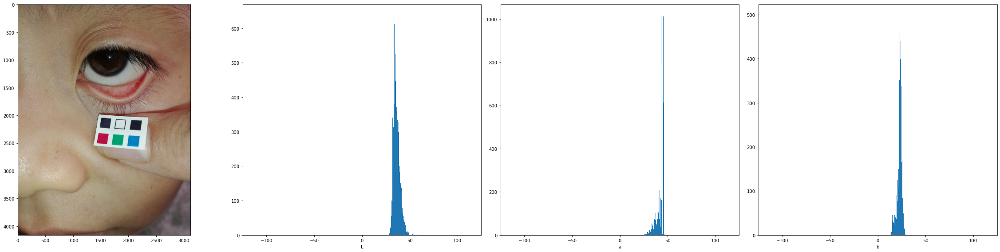

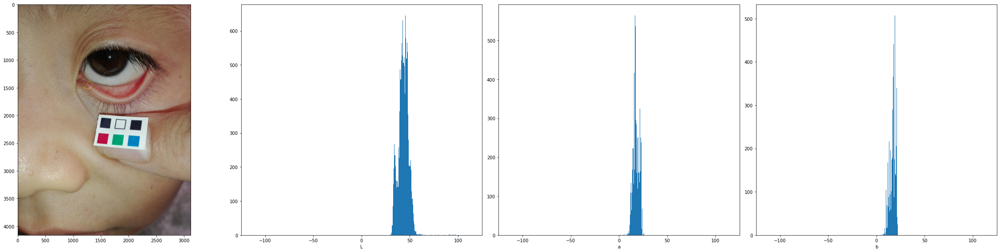

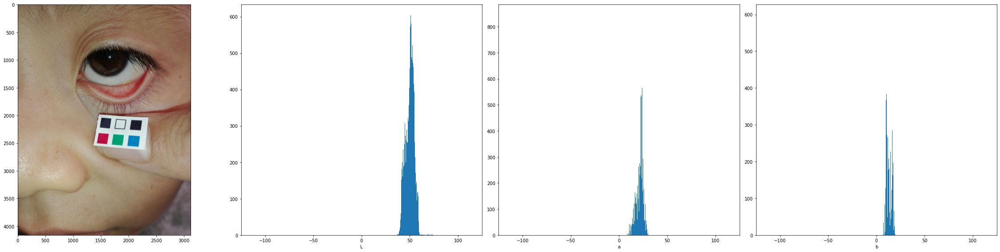

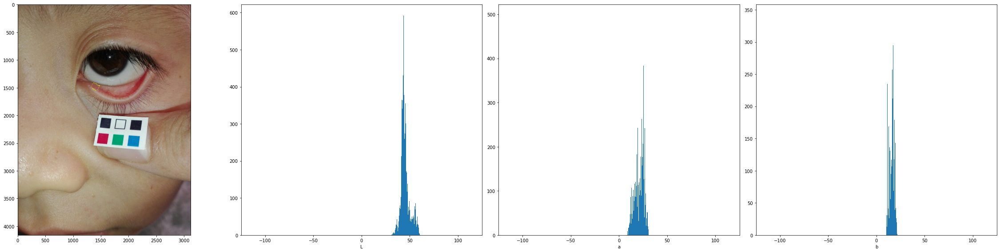

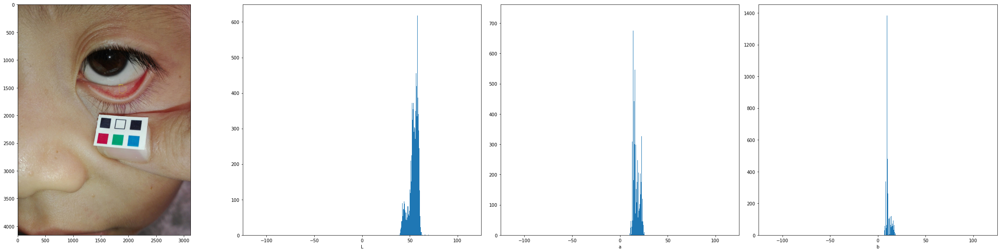

In [164]:
for i in range(1,11):
    indx=np.where(f[:,:,9]==i)
    hists=v_get_Hist_by_format(f,indx[0],indx[1],np.arange(1,10))
    fig, (axi,ax0,ax1,ax2) = plt.subplots(ncols=4, figsize=(32, 8))
    axi.imshow(mark_boundaries(img, m_slic==i, mode='inner',background_label=10))

    ax0.hist(f[indx[0],indx[1],6],125)
    ax0.set_xlabel("L")
    ax0.set_xlim([-125,125])
    ax1.hist(f[indx[0],indx[1],7],125)
    ax1.set_xlabel("a")
    ax1.set_xlim([-125,125])
    ax2.hist(f[indx[0],indx[1],8],125)
    ax2.set_xlim([-125,125])
    ax2.set_xlabel("b")
    
    plt.tight_layout()
    plt.show()

In [36]:
R=f[:,:,0]
G=f[:,:,1]
B=f[:,:,2]
H=f[:,:,3]
S=f[:,:,4]
V=f[:,:,5]
L=f[:,:,6]
A=f[:,:,7]
B=f[:,:,8]

In [54]:
print(V.min())
print(V.max())

0.0
1.0


In [75]:
v,b=np.histogram(f[:,:,3],bins=1000,range=(0,1.5))

In [76]:
v

array([ 99582,   8707,   8387,   9230,   7157,  12946,  15363,  17239,
        17851,  12414,  16991,  13777,  18893,  56166,  14203,  36724,
        32365,  30744,  55124,  76418,  21259,  45292,  91119,  50817,
        56932,  54356,  20282,  63783, 155348,  44961, 101402,  50401,
        79851, 117855,  78325,  83877,  98296, 197612,  78297, 129016,
       190660,  89228, 296711, 167439, 193053,  93419, 131143, 150883,
       254247, 402719, 160511, 111729, 444573, 314064, 281954, 396700,
       331732, 415455, 144245, 149551, 441071, 571037, 281589, 480442,
       250819, 182523,  69671, 609661, 531978, 296584, 132048,  45257,
       114320, 243444, 238290,  46191,  86468,  19869,  18875, 119996,
        23165,  50278,   4194,   7400,  16051,    116,   5499,   8040,
        12514,   1098,    823,     14,  13371,    523,    800,   3409,
         3079,     53,    818,     15,     19,    118,    104,     15,
           32,    284,     16,      3,      0,      0,      0,  27841,
      

In [80]:
hists
np.arange(0,9)

array([0, 1, 2, 3, 4, 5, 6, 7, 8])